Connecting to the Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Importing required libraries

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import Activation
from keras.layers import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
import cv2
from google.colab.patches import cv2_imshow
from sklearn.dummy import DummyClassifier
import matplotlib.pyplot as plt
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator

Loading training images and labels

In [ ]:
train_imgs = []
train_labels = []

for i in range(60,400):
  img = cv2.imread('/content/drive/My Drive/Deep_Learning_Project/Project_Data/train/children/'+str(i)+'.jpg')

  train_imgs.append(cv2.resize(img,(80,80)))
  train_labels.append(0)

for i in range(60,400):
  img = cv2.imread('/content/drive/My Drive/Deep_Learning_Project/Project_Data/train/adults/'+str(i)+'.jpg')
  train_imgs.append(cv2.resize(img,(80,80)))
  train_labels.append(1)

Creating ndarrays for training images and labels

In [ ]:
train_imgs = np.stack(tuple(train_imgs))
train_imgs.shape

(680, 80, 80, 3)

In [ ]:
train_labels = np.stack(tuple(train_labels)).reshape(680,1)
train_labels.shape

(680, 1)

Loading test images and labels

In [ ]:
test_imgs = []
test_labels = []

for i in range(0,60):
  img = cv2.imread('/content/drive/My Drive/Deep_Learning_Project/Project_Data/test/children/'+str(i)+'.jpg')

  test_imgs.append(cv2.resize(img,(80,80)))
  test_labels.append(0)

for i in range(0,60):
  img = cv2.imread('/content/drive/My Drive/Deep_Learning_Project/Project_Data/test/adults/'+str(i)+'.jpg')
  test_imgs.append(cv2.resize(img,(80,80)))
  test_labels.append(1)

Creating ndarrays for test images and labels

In [ ]:
test_imgs = np.stack(tuple(test_imgs))
test_imgs.shape

(120, 80, 80, 3)

In [ ]:
test_labels = np.stack(tuple(test_labels)).reshape(120,1)
test_labels.shape

(120, 1)

Building Naive Classifier Model

In [ ]:
naive_classifier = DummyClassifier(strategy="stratified")
naive_classifier.fit(train_imgs,train_labels)

DummyClassifier(strategy='stratified')

Predicting image class using Naive Classifier

In [ ]:
naive_classifier.predict(test_imgs)

array([1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 1, 1, 0, 1, 0])

Checking the accuracy of Naive Classifier

In [ ]:
naive_classifier.score(test_imgs,test_labels)

0.49166666666666664

Building the CNN Model from scratch for image classification.

In [ ]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) 
model.add(Conv2D(64, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model.add(Activation('relu'))

model.add(MaxPooling2D(pool_size=(4, 4))) 
model.add(Conv2D(128, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model.add(Activation('relu'))


model.add(MaxPooling2D(pool_size=(2, 2))) 
model.add(Conv2D(256, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model.add(Activation('relu'))

model.add(MaxPooling2D(pool_size=(4, 4))) 
model.add(Flatten())
model.add(Dense(350))
model.add(Activation('relu'))
model.add(Dropout(0.23))
model.add(Dense(1))
model.add(Activation('sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 80, 80, 32)        896       
                                                                 
 activation (Activation)     (None, 80, 80, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 40, 40, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 activation_1 (Activation)   (None, 40, 40, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 10, 10, 64)       0         
 2D)                                                    

In [ ]:
model.compile(optimizer="adam", 
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
model_fitting = model.fit(train_imgs, train_labels, validation_data = (test_imgs, test_labels), epochs=50)

Epoch 1/50
22/22 [==============================] - 10s 401ms/step - loss: 7.8818 - accuracy: 0.5074 - val_loss: 0.6986 - val_accuracy: 0.5583
Epoch 2/50
22/22 [==============================] - 9s 412ms/step - loss: 0.6956 - accuracy: 0.5353 - val_loss: 0.6816 - val_accuracy: 0.5583
Epoch 3/50
22/22 [==============================] - 11s 502ms/step - loss: 0.6730 - accuracy: 0.5397 - val_loss: 0.6413 - val_accuracy: 0.5583
Epoch 4/50
22/22 [==============================] - 11s 502ms/step - loss: 0.6719 - accuracy: 0.5691 - val_loss: 0.6450 - val_accuracy: 0.5500
Epoch 5/50
22/22 [==============================] - 9s 388ms/step - loss: 0.6557 - accuracy: 0.5603 - val_loss: 0.6381 - val_accuracy: 0.6167
Epoch 6/50
22/22 [==============================] - 9s 390ms/step - loss: 0.6343 - accuracy: 0.6103 - val_loss: 0.7066 - val_accuracy: 0.5833
Epoch 7/50
22/22 [==============================] - 9s 392ms/step - loss: 0.6270 - accuracy: 0.6382 - val_loss: 0.6377 - val_accuracy: 0.6083
Epo

In [ ]:
print('Training Accuracy: ',max(model_fitting.history['accuracy']))
print('Validation Accuracy: ',max(model_fitting.history['val_accuracy']))

Training Accuracy:  1.0
Validation Accuracy:  0.7250000238418579


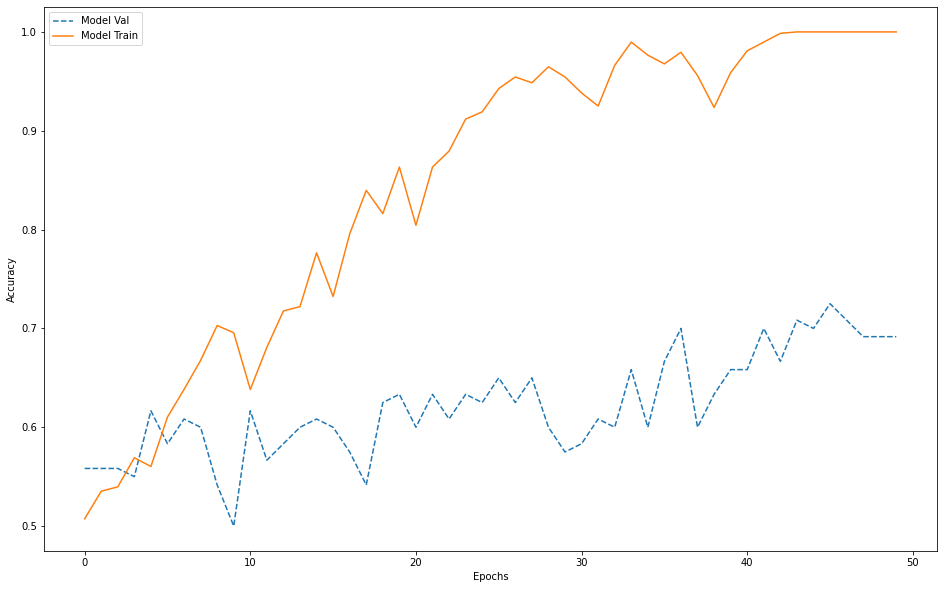

In [ ]:
plt.figure(figsize=(16,10))
plt.plot(model_fitting.epoch, model_fitting.history['val_accuracy'],'--', label='Model Val')
plt.plot(model_fitting.epoch, model_fitting.history['accuracy'], label='Model Train')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

Model based on transfer learning

In [ ]:
base_model = keras.applications.Xception(
    weights="imagenet", 
    input_shape=(80, 80, 3),
    include_top=False,
)

base_model.trainable = False

inputs = keras.Input(shape=(80, 80, 3))

scale_layer = keras.layers.Rescaling(scale=1 / 127.5, offset=-1)
x = scale_layer(inputs)

x = base_model(x, training=False)
x = keras.layers.MaxPooling2D()(x)
x = keras.layers.Dropout(0.5)(x) 
outputs = keras.layers.Dense(1)(x)
new_model = keras.Model(inputs, outputs)

new_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 80, 80, 3)]       0         
                                                                 
 rescaling (Rescaling)       (None, 80, 80, 3)         0         
                                                                 
 xception (Functional)       (None, 3, 3, 2048)        20861480  
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 1, 1, 2048)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 1, 1, 2048)        0         
                                                                 
 dense_2 (Dense)             (None, 1, 1, 1)           2049      
                                                             

In [ ]:
new_model.compile(
    optimizer="adam",
    loss='binary_crossentropy',
    metrics=['accuracy'],
)

new_model.fit(train_imgs, train_labels, validation_data = (test_imgs, test_labels), epochs=10)

Epoch 1/10
22/22 [==============================] - 24s 977ms/step - loss: 6.3187 - accuracy: 0.4904 - val_loss: 5.4510 - val_accuracy: 0.4605
Epoch 2/10
22/22 [==============================] - 20s 916ms/step - loss: 6.0334 - accuracy: 0.4996 - val_loss: 4.8652 - val_accuracy: 0.4561
Epoch 3/10
22/22 [==============================] - 20s 925ms/step - loss: 6.4038 - accuracy: 0.5003 - val_loss: 6.0113 - val_accuracy: 0.5439
Epoch 4/10
22/22 [==============================] - 20s 921ms/step - loss: 6.0506 - accuracy: 0.5013 - val_loss: 5.0913 - val_accuracy: 0.5197
Epoch 5/10
22/22 [==============================] - 21s 942ms/step - loss: 6.4675 - accuracy: 0.4967 - val_loss: 6.4918 - val_accuracy: 0.4934
Epoch 6/10
22/22 [==============================] - 21s 961ms/step - loss: 6.2387 - accuracy: 0.4974 - val_loss: 6.0540 - val_accuracy: 0.4474
Epoch 7/10
22/22 [==============================] - 20s 921ms/step - loss: 6.3077 - accuracy: 0.4974 - val_loss: 7.1032 - val_accuracy: 0.4605

In [ ]:
base_model.trainable = True
new_model.summary()

new_model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy'],
)

new_model_history = new_model.fit(train_imgs, train_labels, validation_data = (test_imgs, test_labels), epochs=5)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 80, 80, 3)]       0         
                                                                 
 rescaling (Rescaling)       (None, 80, 80, 3)         0         
                                                                 
 xception (Functional)       (None, 3, 3, 2048)        20861480  
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 1, 1, 2048)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 1, 1, 2048)        0         
                                                                 
 dense_2 (Dense)             (None, 1, 1, 1)           2049      
                                                             

In [ ]:
print('Training Accuracy: ',max(new_model_history.history['accuracy']))
print('Validation Accuracy: ',max(new_model_history.history['val_accuracy']))

Training Accuracy:  0.5013909339904785
Validation Accuracy:  0.5504385828971863


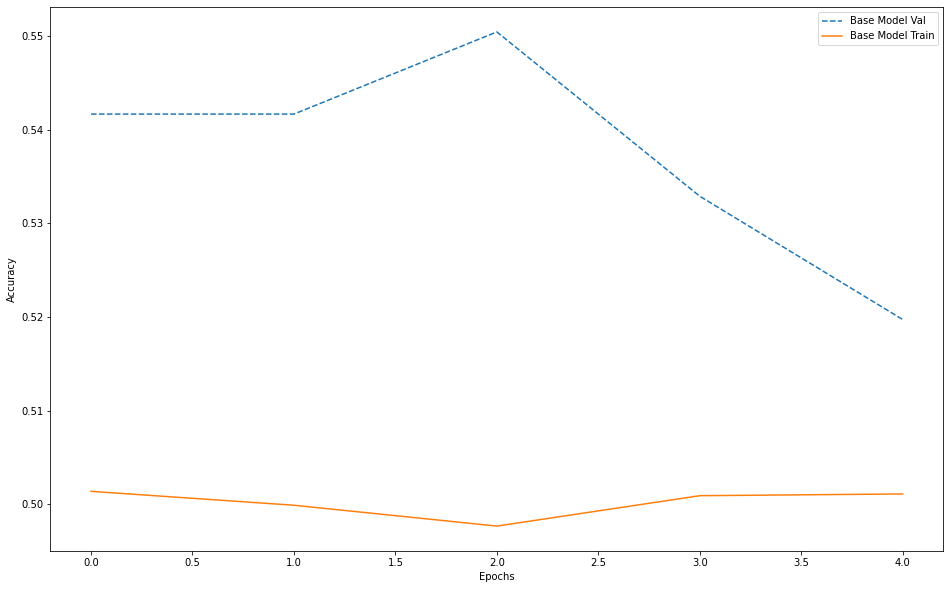

In [ ]:
plt.figure(figsize=(16,10))
plt.plot(new_model_history.epoch, new_model_history.history['val_accuracy'],'--', label='Base Model Val')
plt.plot(new_model_history.epoch, new_model_history.history['accuracy'], label='Base Model Train')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

Augmenting Trainnig Data

In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

for _ in range(1,171):
  n = random.choice([x for x in range(680) if (x not in l1) and (x not in l2) and (x not in l3) and (x not in l4)])
  l1.append(n)

for _ in range(1,171):
  n = random.choice([x for x in range(680) if (x not in l1) and (x not in l2) and (x not in l3) and (x not in l4)])
  l2.append(n)

for _ in range(1,171):
  n = random.choice([x for x in range(680) if (x not in l1) and (x not in l2) and (x not in l3) and (x not in l4)])
  l3.append(n)

for _ in range(1,171):
  n = random.choice([x for x in range(680) if (x not in l1) and (x not in l2) and (x not in l3) and (x not in l4)])
  l4.append(n)

In [ ]:
print(train_imgs[0].shape)
print(train_labels[0].shape)

(80, 80, 3)
(1,)


In [ ]:
aug_train_imgs = []
aug_train_img_lb = []
for i in range(0,680):
  aug_train_imgs.append(train_imgs[i])
  aug_train_img_lb.append(train_labels[i])

Rotating sample images 

In [ ]:
I2 = train_imgs[l2]
L2 = train_labels[l2]
datagen = ImageDataGenerator(rotation_range=90)
d = datagen.flow(I2, L2, batch_size=1)
for i in range(0,170):
  aug_train_imgs.append(d[i][0][0])
  aug_train_img_lb.append(d[i][1][0])

Shifting sample images height and width

In [ ]:
I3 = train_imgs[l3]
L3 = train_labels[l3]
datagen = ImageDataGenerator(width_shift_range=0.2, height_shift_range=0.2)
d = datagen.flow(I3, L3, batch_size=1)
for i in range(0,170):
  aug_train_imgs.append(d[i][0][0])
  aug_train_img_lb.append(d[i][1][0])

Flipping sample images horizontally and vertically

In [ ]:
I4 = train_imgs[l4]
L4 = train_labels[l4]
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
d = datagen.flow(I4, L4, batch_size=1)
for i in range(0,170):
  aug_train_imgs.append(d[i][0][0])
  aug_train_img_lb.append(d[i][1][0])

Printed augmented images

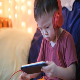

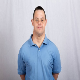

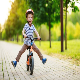

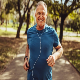

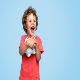

...

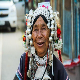

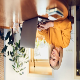

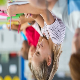

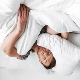

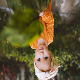

In [ ]:
for i in aug_train_imgs:
  cv2_imshow(i)
  print()

Creating ndarrays for augmented images and corresponding labels

In [ ]:
aug_train_imgs = np.stack(tuple(aug_train_imgs))
aug_train_imgs.shape

(1190, 80, 80, 3)

In [ ]:
aug_train_img_lb = np.stack(tuple(aug_train_img_lb)).reshape(1190,1)
aug_train_img_lb.shape

(1190, 1)

Training CNN model built with augmented data

In [ ]:
model2 = Sequential()
model2.add(Conv2D(32, (3, 3), padding='same', input_shape=aug_train_imgs.shape[1:])) 
model2.add(Activation('relu'))
model2.add(MaxPooling2D(pool_size=(2, 2))) 
model2.add(Conv2D(64, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model2.add(Activation('relu'))

model2.add(MaxPooling2D(pool_size=(4, 4))) 
model2.add(Conv2D(128, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model2.add(Activation('relu'))


model2.add(MaxPooling2D(pool_size=(2, 2))) 
model2.add(Conv2D(256, (3, 3), padding='same', input_shape=train_imgs.shape[1:])) 
model2.add(Activation('relu'))

model2.add(MaxPooling2D(pool_size=(4, 4))) 
model2.add(Flatten())
model2.add(Dense(350))
model2.add(Activation('relu'))
model2.add(Dropout(0.23))
model2.add(Dense(1))
model2.add(Activation('sigmoid'))

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 80, 80, 32)        896       
                                                                 
 activation_6 (Activation)   (None, 80, 80, 32)        0         
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 activation_7 (Activation)   (None, 40, 40, 64)        0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 10, 10, 64)       0         
 2D)                                                  

In [ ]:
model2.compile(optimizer="adam", 
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
model_fitting_aug = model2.fit(aug_train_imgs, aug_train_img_lb, validation_data = (test_imgs, test_labels), epochs=50)

Epoch 1/50
38/38 [==============================] - 17s 399ms/step - loss: 4.2217 - accuracy: 0.5202 - val_loss: 0.6762 - val_accuracy: 0.5667
Epoch 2/50
38/38 [==============================] - 14s 381ms/step - loss: 0.6698 - accuracy: 0.5714 - val_loss: 0.6596 - val_accuracy: 0.5750
Epoch 3/50
38/38 [==============================] - 14s 381ms/step - loss: 0.6625 - accuracy: 0.5739 - val_loss: 0.6413 - val_accuracy: 0.5667
Epoch 4/50
38/38 [==============================] - 16s 411ms/step - loss: 0.6000 - accuracy: 0.6765 - val_loss: 0.7422 - val_accuracy: 0.6000
Epoch 5/50
38/38 [==============================] - 14s 381ms/step - loss: 0.5731 - accuracy: 0.6966 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 6/50
38/38 [==============================] - 16s 430ms/step - loss: 0.4860 - accuracy: 0.7563 - val_loss: 0.6297 - val_accuracy: 0.6583
Epoch 7/50
38/38 [==============================] - 14s 380ms/step - loss: 0.4554 - accuracy: 0.7824 - val_loss: 0.6036 - val_accuracy: 0.6917

In [ ]:
print('Training Accuracy: ',max(model_fitting_aug.history['accuracy']))
print('Validation Accuracy: ',max(model_fitting_aug.history['val_accuracy']))

Training Accuracy:  1.0
Validation Accuracy:  0.7333333492279053


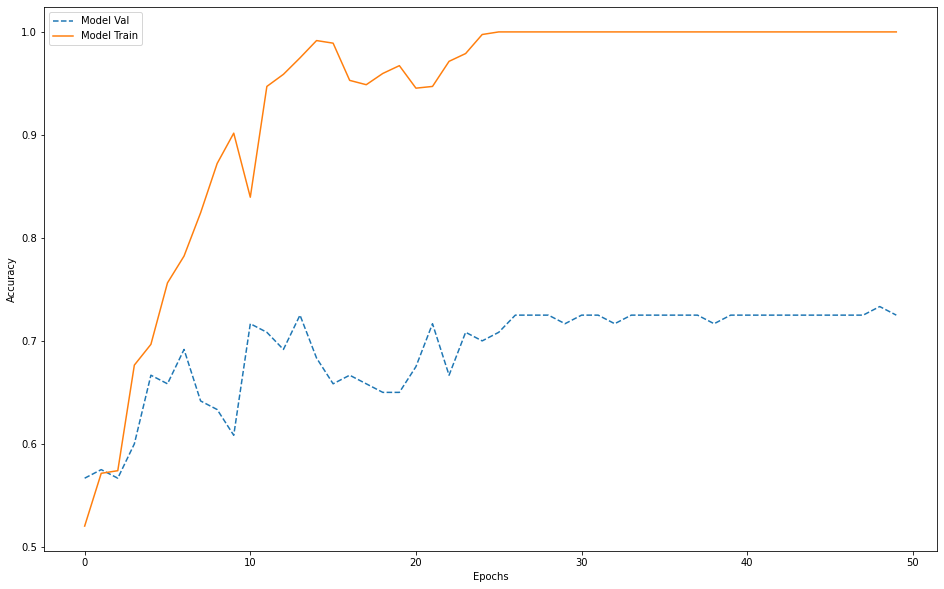

In [ ]:
plt.figure(figsize=(16,10))
plt.plot(model_fitting_aug.epoch, model_fitting_aug.history['val_accuracy'],'--', label='Model Val')
plt.plot(model_fitting_aug.epoch, model_fitting_aug.history['accuracy'], label='Model Train')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()